In [1]:
import pickle
%matplotlib inline
from collections import defaultdict
import pylab as plt

In [3]:
def get_clusters(part):
    cluster_assignment=defaultdict(list)
    for k,v in part.iteritems():
        cluster_assignment[v].append(k)
    #print out the length of each cluster
    for k in cluster_assignment.keys():
        print k,len(cluster_assignment[k])
    return cluster_assignment

In [10]:

def read_csv_data_meta_unigram(data_file):
    f=open(data_file,'r').read().split('\n')
    all_csv_data=[]
    all_lab=[]
    for line in f:
        if line=='':
            continue
        l=line.split(',')[:-1]
        b=line.split(',')[-1]
        #l=[float(i) for i in l]
        all_csv_data.append(l)
        all_lab.append(b)
    return all_csv_data,all_lab

In [11]:
def read_csv_data_meta(data_file):
    f=open(data_file,'r').read().split('\n')
    all_csv_data=[]
    all_lab=[]
    for line in f:
        if line=='':
            continue
        l=line.split(',')[:-4]
        b=line.split(',')[-4:]
        #l=[float(i) for i in l]
        all_csv_data.append(l)
        all_lab.append(b)
    return all_csv_data,all_lab

In [28]:
def plot_clusters(path,pfile,csv_file):
    #pfile='downsample_syl_3_meta_200_421_pkl_part.pkl'
    #path='core_subdata/'
    part=pickle.load(open(path+pfile,'r'))
    clust=get_clusters(part)
    #csv_file='subdata/downsample_syl_3_meta_200_421.csv'
    ngram=csv_file.split('.')[0].split('_')[-1]
    csvdata,lab=read_csv_data_meta(csv_file)
    #print len(csvdata)
    for j in clust.keys():
        inds=clust[j]
        plt.figure()
        for i in inds:
            #print 'i',i
            
            #print len(csvdata[i])
            plt.plot(csvdata[i])
            plt.title(ngram+"|"+str(j))

In [29]:
def plot_clusters_tonerec(path,pfile,csv_file):
    #pfile='downsample_syl_3_meta_200_421_pkl_part.pkl'
    #path='core_subdata/'
    part=pickle.load(open(path+pfile,'r'))
    clust=get_clusters(part)
    #csv_file='subdata/downsample_syl_3_meta_200_421.csv'
    #ngram=csv_file.split('.')[0].split('_')[-1]
    
    csvdata,lab=read_csv_data_meta(csv_file)
    
    #print csvdata
    #print lab
    for j in clust.keys():
        inds=clust[j]
        plt.figure()
        this_labs=[]
        for i in inds:
            #print 'index:',i
            plt.plot(csvdata[i])
            this_labs.append(lab[i])
        tone_prop=[]
        #print 'this labs:',this_labs
        for k in range(1,5):
            num_tk=len([x for x in this_labs if int(x)==k])
            tone_prop.append(num_tk)
        print tone_prop
        #title=str()
        plt.title("|"+str(j))

# plotting all the subshape clusters by community detection from each n-gram data file

## 5 randomly sampled ngrams data have been selected to apply the community detection, here we see there results

--------- downsample_syl_3_meta_200_134_pkl_part.pkl
0 181
1 183
2 212
3 116
4 2
5 4
6 9
7 5
8 2
9 12
10 12
11 2
12 2
13 11
14 4
15 2
16 2
17 6
18 2
19 3
20 2
21 2
22 2
23 2
24 5
25 2
--------- downsample_syl_3_meta_200_314_pkl_part.pkl
0 85
1 119
2 154
3 17
4 168
5 175
6 11
7 2
8 11
9 2
10 3
11 2
12 4
--------- downsample_syl_3_meta_200_322_pkl_part.pkl
0 57
1 53
2 120
3 112
4 119
5 80
6 2
7 3
8 2
9 11
10 3
11 3
12 2
--------- downsample_syl_3_meta_200_342_pkl_part.pkl
0 82
1 136
2 38
3 173
4 2
5 58
6 5
7 172
8 9
9 12
10 2
11 6
12 3
13 3
14 7
15 2
16 2
17 2
18 2
19 4
20 2
21 2
22 3
23 3
24 3
25 2
26 2
27 2
28 2
29 2
30 2
31 2
32 2
33 2
34 2
--------- downsample_syl_3_meta_200_421_pkl_part.pkl
0 85
1 156
2 148
3 160
4 183
5 59
6 120
7 2
8 3
9 4
10 2
11 2
12 3
13 4
14 2
15 2
16 2
17 2
18 2
19 3
20 2
21 4
22 2


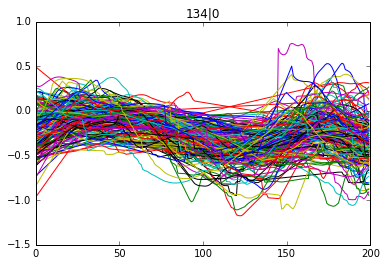

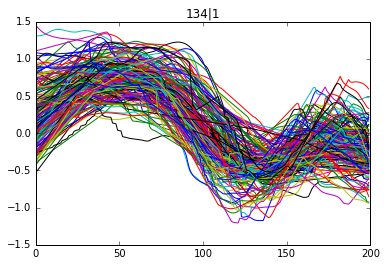

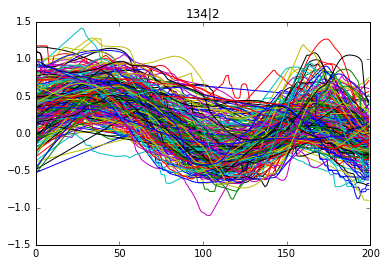

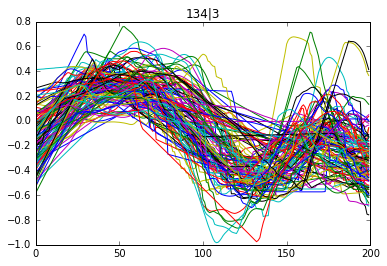

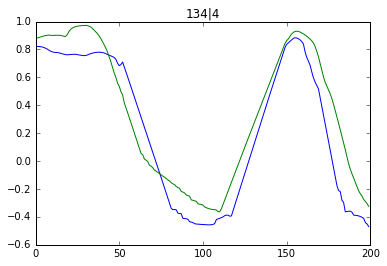

...

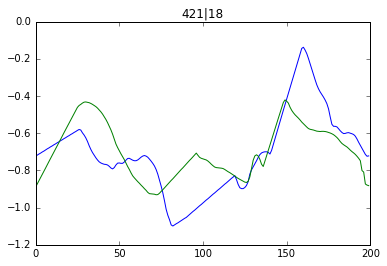

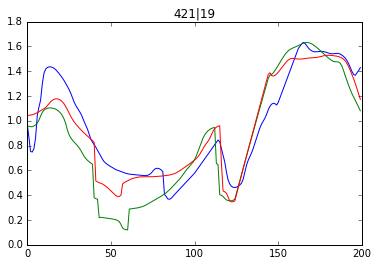

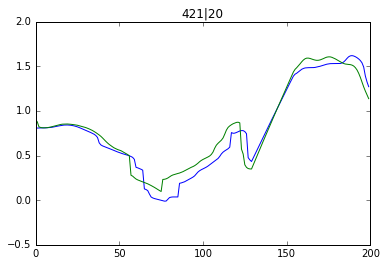

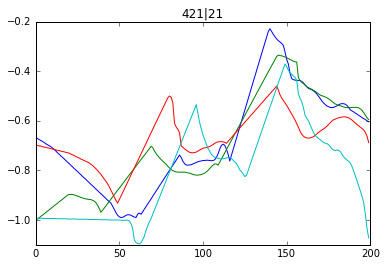

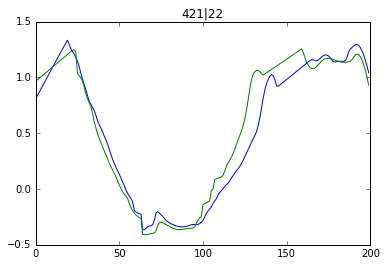

In [30]:
from os import listdir
#pfile='downsample_syl_3_meta_200_421_pkl_part.pkl'\
path='core_subdata/'
pfiles = [ f for f in listdir(path) if f.endswith('_part.pkl')]


for p in pfiles:
    print '---------', p
    csv_file='subdata/'+p.replace('_pkl_part.pkl','.csv')
    plot_clusters(path,p,csv_file)

# thoughts: 5/16/17

1. we need to try this now: shape ML. if this is successful then we have all parts in our diss (almost).

2. justification of clusters: first, this is a shape class problem, not label. therefore, the nature of this problem is exactly the same as what the algo is designed for in the MIR case, and also in its algorithm of distance based pruning. therefore, being a published algorithm that has advantage over the k means, it is in itself a validation. 

3. first, we can perform a classification task to see if we can use the curves themselves to be classified into these classes. 



# early phase thoughts below

below are some early phase thoughts including:

1. whether the clusters are good enough;

2. do we need to do evealuation on the tone recognition;

## Conclusion

The result above is not totally exact (there maybe rooms for getting more precise/similar subshapes), but they do make sense. in any case, the thresholds are derived from a principled and previously published method, so we can take this as is for now (don't let intuition ruin your progress).big clusters has more variants, small ones are quite closely matched. To see that these are the different types of shapes that a tone ngram has produced, it is still quite extraordinary. But at the same time we may doubt that are these the established shapes that can serve as classes for the basis of a classification task? or are they somewhat still random? I think coming from a big data, these shapes are robust enough for now. There are many classes indeed so the results won't be very good probably. But my conclusion is that we could give this a try.

# plans

1. compare uni-gram with ngram in terms of classification results
2. some classes are too small - there is a serious imbalance. Large classes tend to be a bit noisy.
3. crucial part is how the feature is going to be: like the subjectNP feature, what is the unit for that feature? I think something along the line of binary or bag-of-prosody features in the prosody and coref paper:<b>Using prosodic annotations to improve coreference resolution of spoken text</b>

# evaluation of clusters/communities
4. still, there are some shortcomings of using this as class. First, the community detection is based on modularity, and doesn't necessarily mean the classes are maximally different. It is somewhat random in a sense. It is totally possible you need to combine some small clusters as they are quite similar. 
5. and again, it comes down to evaluation - currently there is no good way to evaluate quality of these clsuters derived from this method, or evaluate against another method. we need to think hard about this. Only after you performed this step and you know the clusters are reliable then you can use it in a classification task. Otherwise this is too random.

# evaluation plans and alternative methods to Louvain
1. we can use other community detection methods and evaluate against louvain. 
2. whatever method we evaluate, we need to have a way of evaluation. There are in general intrinsic and extrinsic evaluation. Intrinsic is mostly tightness of the clusters. IR book lists four extrinsic evaluations in IR applications. We can consider all of these. 
3. The lack of gold standard ground truth is a common problem in network community detection. Let's see a evaluation with gold standard here https://cs.stanford.edu/people/jure/pubs/comscore-icdm12.pdf.

# looking at clusters derived with tone-rec-network data set

## 1000 tones in this data set, voiced only, best_threshold=0.4

['downsample_syl_noneut_subset_gpickle_part.pkl']
--------- downsample_syl_noneut_subset_gpickle_part.pkl
tone-rec-network/downsample_syl_noneut_subset_wlabel.csv
0 103
1 182
2 136
3 139
4 164
5 162
6 5
7 4
8 9
9 9
10 14
11 3
12 2
13 2
14 11
[65, 11, 5, 22]
[82, 27, 16, 57]
[26, 32, 34, 44]
[17, 45, 45, 32]
[43, 46, 39, 36]
[11, 52, 76, 23]
[1, 4, 0, 0]
[0, 1, 3, 0]
[0, 3, 3, 3]
[0, 0, 1, 8]
[0, 13, 1, 0]
[0, 1, 1, 1]
[0, 2, 0, 0]
[0, 2, 0, 0]
[0, 0, 0, 11]


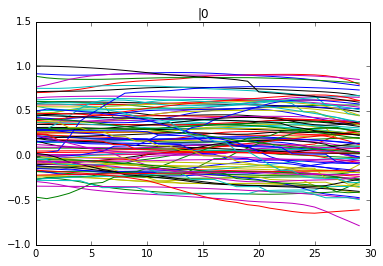

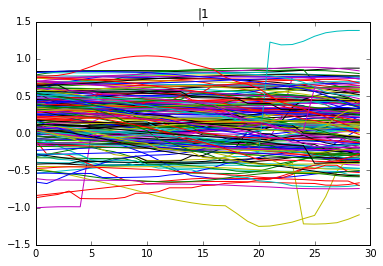

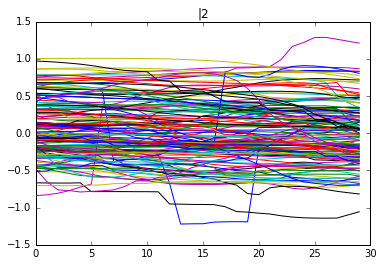

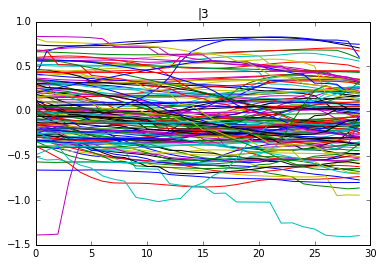

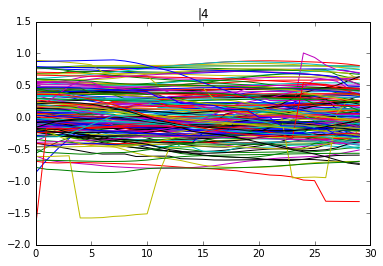

...

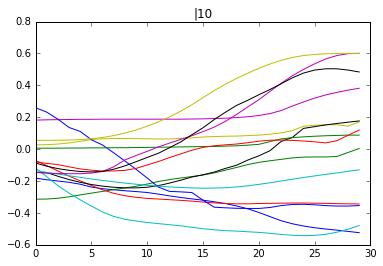

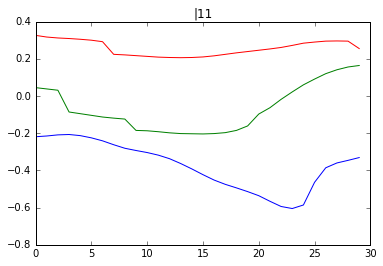

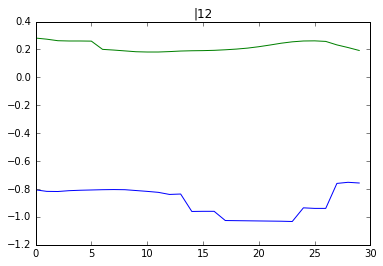

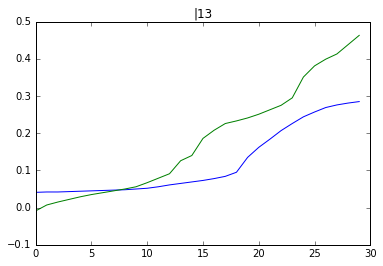

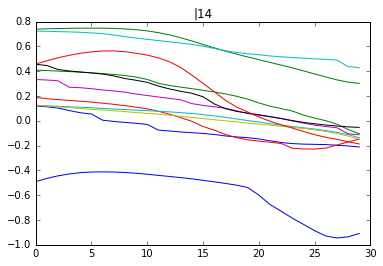

In [8]:
from os import listdir
#pfile='downsample_syl_3_meta_200_421_pkl_part.pkl'\
path='tone-rec-network/'
pfiles = [ f for f in listdir(path) if f.endswith('_part.pkl')]
print pfiles

for p in pfiles:
    print '---------', p
    csv_file=path+p.replace('_gpickle_part.pkl','_wlabel.csv')
    print csv_file
    plot_clusters_tonerec(path,p,csv_file)

# next

1. what we should do is to implement a thresholding experiment that maximizes tone recognition (by merging the clusters)
2. what can we do with symbolic representation?

# experimenting with other thresholds in tone-rec task

In [55]:
def exp_thres(best_threshold):
    pfile='tone-rec-network/downsample_syl_noneut_subset.gpickle'
    print 'loading graph...'
    start_time = time.time()
    #pfile='subdata/downsample_syl_2_meta_100_11.pkl'
    G = nx.read_gpickle(pfile) 
    print("--- %s seconds ---" % (time.time() - start_time))

    #applying a threshold without experimenting with CCs. before, we used 0.4 (result of Sankalp's method)
    #best_threshold=0.2
    esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] <=best_threshold and d['weight']>0.01]
    print len(esmall)
    H=nx.Graph(esmall)
    print 'average cc:'+str(nx.average_clustering(H))

    #community detection
    print 'community detection...'
    part = community.best_partition(H)
    #mod = community.modularity(part,H)
    #plt.figure(num=None, figsize=(15, 12), dpi=120, facecolor='w', edgecolor='k')
    #plot, color nodes using community structure
    values = [part.get(node) for node in H.nodes()]
    #nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=30, with_labels=True)
    #commu_plot_name = pfile.replace('.','_') + '_community.pdf'
    #plt.savefig(plt_path+commu_plot_name)
    partition_pickle_file=pfile.replace('.','_') + '_part02.pkl'
    pickle.dump(part,open(partition_pickle_file,'w'))
    
    path='tone-rec-network/'
    pfiles = [ f for f in listdir(path) if f.endswith('_part02.pkl')]
    print pfiles

    for p in pfiles:
        print '---------', p
        csv_file=path+p.replace('_gpickle_part02.pkl','_wlabel.csv')
        print csv_file
        plot_clusters_tonerec(path,p,csv_file)

In [51]:
import time
import networkx as nx
import community

#what if I try a different threshold on this data set and see the partition results.
pfile='tone-rec-network/downsample_syl_noneut_subset.gpickle'
print 'loading graph...'
start_time = time.time()
#pfile='subdata/downsample_syl_2_meta_100_11.pkl'
G = nx.read_gpickle(pfile) 
print("--- %s seconds ---" % (time.time() - start_time))

#applying a threshold without experimenting with CCs. before, we used 0.4 (result of Sankalp's method)
best_threshold=0.2
esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] <=best_threshold and d['weight']>0.01]
print len(esmall)
H=nx.Graph(esmall)
print 'average cc:'+str(nx.average_clustering(H))

#community detection
print 'community detection...'
part = community.best_partition(H)
#mod = community.modularity(part,H)
#plt.figure(num=None, figsize=(15, 12), dpi=120, facecolor='w', edgecolor='k')
#plot, color nodes using community structure
values = [part.get(node) for node in H.nodes()]
#nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=30, with_labels=True)
#commu_plot_name = pfile.replace('.','_') + '_community.pdf'
#plt.savefig(plt_path+commu_plot_name)
partition_pickle_file=pfile.replace('.','_') + '_part02.pkl'
pickle.dump(part,open(partition_pickle_file,'w'))

loading graph...
--- 4.98607802391 seconds ---
3394
average cc:0.518901542453
community detection...


## threshold experiments

['downsample_syl_noneut_subset_gpickle_part02.pkl']
--------- downsample_syl_noneut_subset_gpickle_part02.pkl
tone-rec-network/downsample_syl_noneut_subset_wlabel.csv
0 60
1 35
2 75
3 24
4 56
5 5
6 58
7 46
8 41
9 87
10 2
11 56
12 8
13 2
14 55
15 25
16 11
17 2
18 2
19 2
20 2
21 3
22 27
23 2
24 7
25 7
26 2
27 2
28 3
29 7
30 2
31 12
32 2
33 6
34 2
35 2
36 7
37 2
38 2
39 6
40 2
41 3
42 3
43 2
44 2
45 2
46 3
[40, 6, 2, 12]
[16, 6, 4, 9]
[17, 25, 16, 17]
[17, 3, 2, 2]
[13, 13, 18, 12]
[5, 0, 0, 0]
[34, 12, 5, 7]
[24, 4, 4, 14]
[5, 6, 21, 9]
[11, 28, 30, 18]
[1, 0, 0, 1]
[14, 10, 15, 17]
[1, 0, 4, 3]
[1, 0, 1, 0]
[20, 9, 13, 13]
[3, 14, 8, 0]
[8, 0, 1, 2]
[1, 1, 0, 0]
[2, 0, 0, 0]
[1, 0, 0, 1]
[1, 1, 0, 0]
[1, 0, 2, 0]
[2, 0, 19, 6]
[0, 1, 1, 0]
[0, 0, 1, 6]
[0, 0, 6, 1]
[0, 1, 1, 0]
[0, 0, 1, 1]
[0, 2, 1, 0]
[0, 6, 1, 0]
[0, 1, 1, 0]
[0, 0, 1, 11]
[0, 0, 1, 1]
[0, 0, 1, 5]
[0, 2, 0, 0]
[0, 2, 0, 0]
[0, 7, 0, 0]
[0, 1, 0, 1]
[0, 2, 0, 0]
[0, 6, 0, 0]
[0, 2, 0, 0]
[0, 2, 0, 1]
[0, 0, 0, 3]
[0,

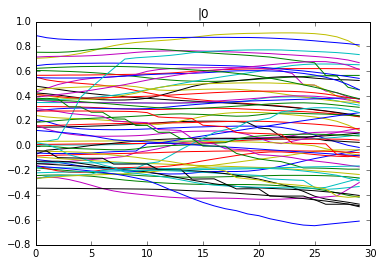

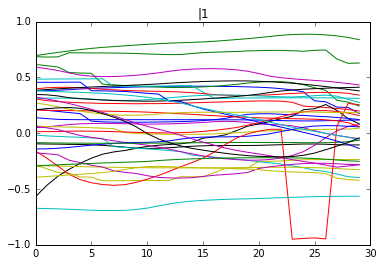

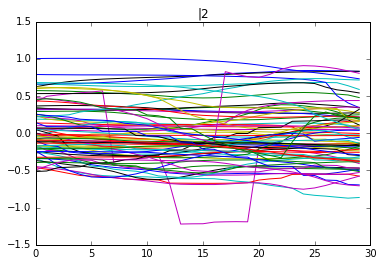

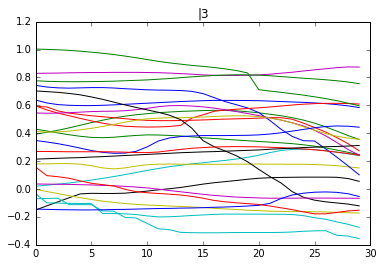

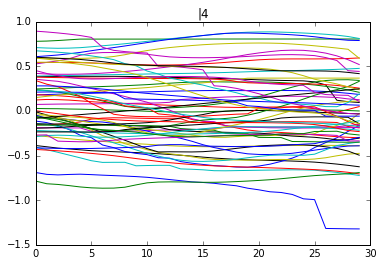

...

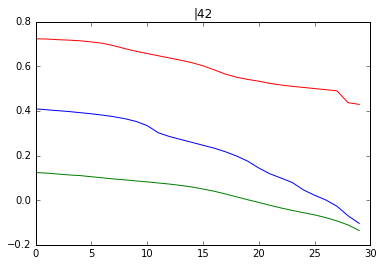

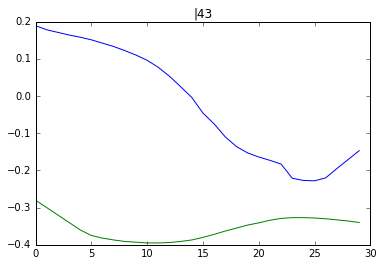

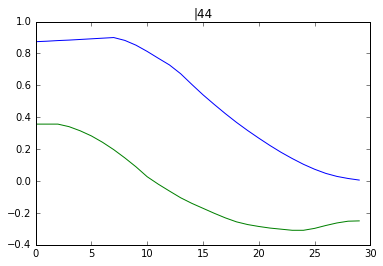

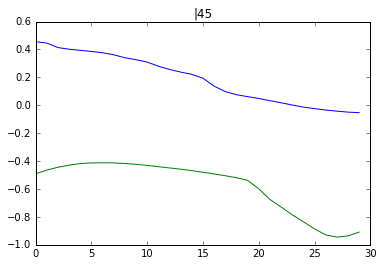

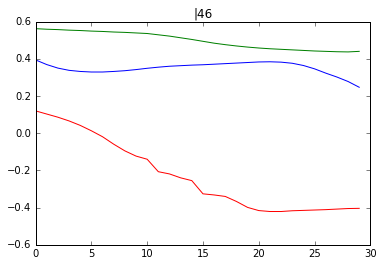

In [52]:
from os import listdir
#pfile='downsample_syl_3_meta_200_421_pkl_part.pkl'\
path='tone-rec-network/'
pfiles = [ f for f in listdir(path) if f.endswith('_part02.pkl')]
print pfiles

for p in pfiles:
    print '---------', p
    csv_file=path+p.replace('_gpickle_part02.pkl','_wlabel.csv')
    print csv_file
    plot_clusters_tonerec(path,p,csv_file)

This is not good - when you have 0.2 as threshold, there are many small communities, that's why in terms of community structure Sankalp's method does make sense. and they still don't seem to be very tightly similar when considering intra-cluster. (yeah well, that's why with k-means clsutering there is really no accuracy that can be reported, but with our above Sankalp's method, we can actually merge some clusters and report an accuracy! I wonder how can we merge them or like a hierarchical clustering. IS there a way we can produce clusters in different levels?).

loading graph...
--- 4.63115715981 seconds ---
1410
average cc:0.42025805418
community detection...
['downsample_syl_noneut_subset_gpickle_part02.pkl']
--------- downsample_syl_noneut_subset_gpickle_part02.pkl
tone-rec-network/downsample_syl_noneut_subset_wlabel.csv
0 44
1 34
2 28
3 26
4 34
5 36
6 38
7 27
8 37
9 48
10 33
11 13
12 4
13 5
14 47
15 2
16 9
17 3
18 7
19 3
20 10
21 2
22 2
23 3
24 4
25 2
26 2
27 2
28 2
29 2
30 3
31 4
32 3
33 2
34 2
35 2
36 7
37 2
38 2
39 10
40 4
41 2
42 2
43 5
44 2
45 3
46 4
47 4
48 4
49 2
50 3
51 2
52 3
53 5
54 2
55 2
56 2
57 2
58 4
59 3
60 2
61 2
62 2
63 2
[34, 4, 2, 4]
[11, 11, 7, 5]
[6, 7, 6, 9]
[19, 4, 1, 2]
[17, 6, 4, 7]
[15, 6, 10, 5]
[22, 9, 4, 3]
[17, 2, 2, 6]
[6, 4, 18, 9]
[5, 16, 18, 9]
[11, 7, 10, 5]
[2, 9, 0, 2]
[4, 0, 0, 0]
[4, 0, 0, 1]
[11, 8, 14, 14]
[1, 0, 0, 1]
[1, 1, 1, 6]
[1, 0, 1, 1]
[5, 0, 1, 1]
[1, 0, 2, 0]
[2, 5, 2, 1]
[2, 0, 0, 0]
[2, 0, 0, 0]
[2, 1, 0, 0]
[2, 0, 2, 0]
[1, 1, 0, 0]
[1, 0, 1, 0]
[1, 1, 0, 0]
[1, 1, 0, 0]
[1, 0, 0, 1]
[

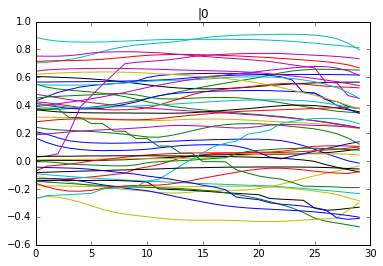

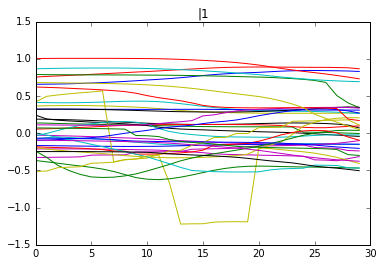

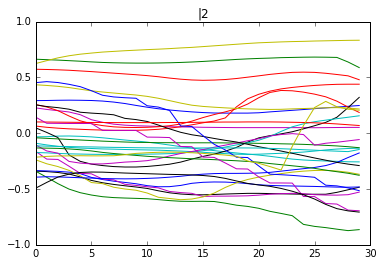

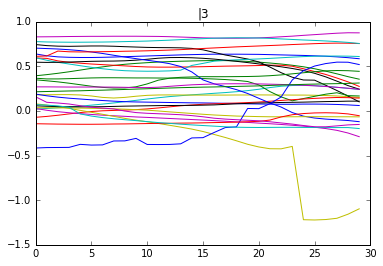

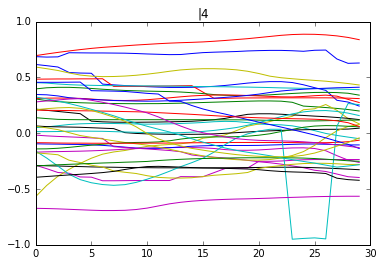

...

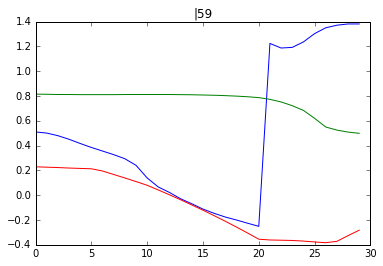

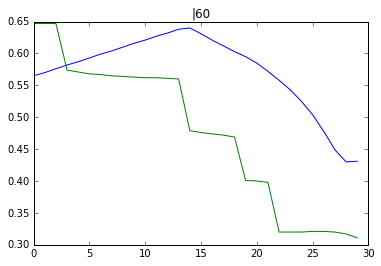

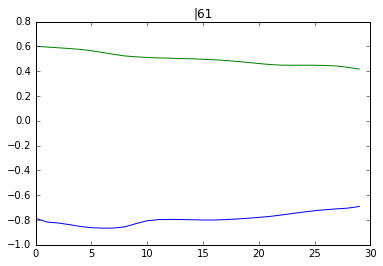

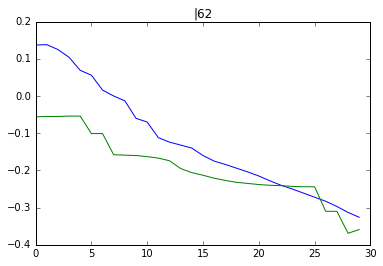

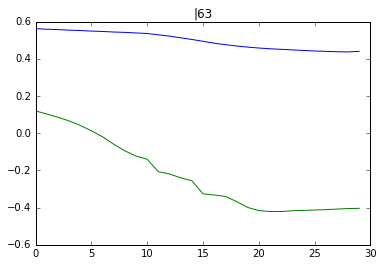

In [56]:
exp_thres(0.15)

loading graph...
--- 4.86177802086 seconds ---
363
average cc:0.261001558087
community detection...
['downsample_syl_noneut_subset_gpickle_part02.pkl']
--------- downsample_syl_noneut_subset_gpickle_part02.pkl
tone-rec-network/downsample_syl_noneut_subset_wlabel.csv
0 19
1 9
2 6
3 2
4 17
5 5
6 10
7 3
8 3
9 5
10 18
11 2
12 2
13 2
14 3
15 8
16 6
17 3
18 14
19 5
20 3
21 2
22 11
23 2
24 4
25 5
26 18
27 2
28 2
29 9
30 2
31 2
32 2
33 9
34 2
35 2
36 2
37 7
38 2
39 2
40 3
41 3
42 2
43 2
44 3
45 2
46 3
47 2
48 2
49 2
50 3
51 2
52 2
53 2
54 2
55 3
56 4
57 2
58 3
59 2
60 2
61 3
62 2
63 2
64 3
65 2
66 4
67 2
68 2
69 4
70 2
71 2
72 2
73 4
74 2
75 2
76 3
77 2
[15, 1, 0, 3]
[4, 2, 3, 0]
[2, 1, 0, 3]
[0, 1, 0, 1]
[9, 3, 1, 4]
[2, 2, 0, 1]
[8, 1, 0, 1]
[1, 2, 0, 0]
[1, 1, 1, 0]
[1, 2, 1, 1]
[6, 5, 5, 2]
[2, 0, 0, 0]
[2, 0, 0, 0]
[1, 0, 1, 0]
[1, 2, 0, 0]
[5, 0, 1, 2]
[3, 2, 0, 1]
[2, 0, 1, 0]
[8, 2, 2, 2]
[2, 1, 1, 1]
[1, 0, 0, 2]
[1, 0, 1, 0]
[7, 2, 2, 0]
[2, 0, 0, 0]
[1, 1, 1, 1]
[3, 1, 1, 0]
[7, 4, 

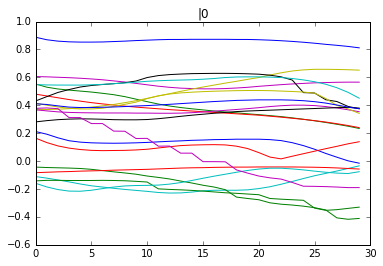

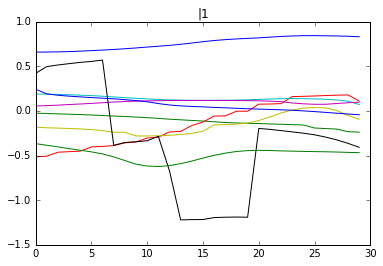

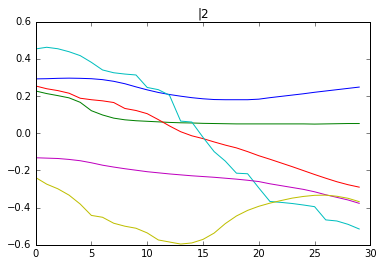

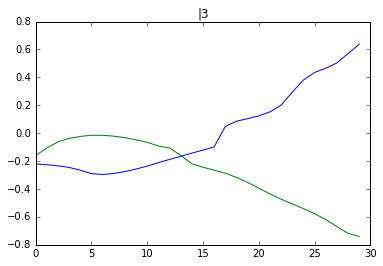

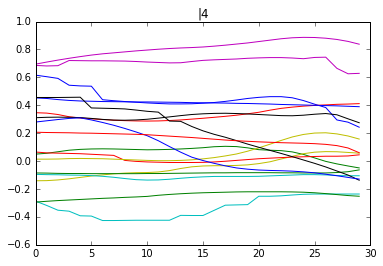

...

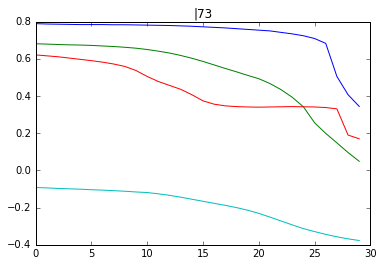

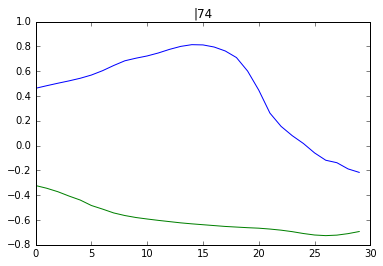

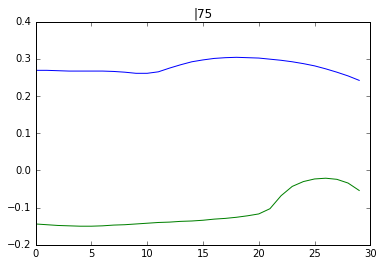

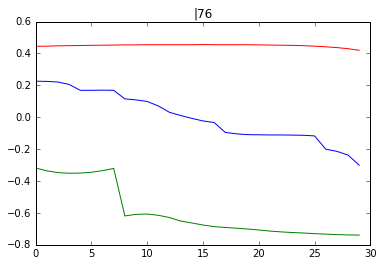

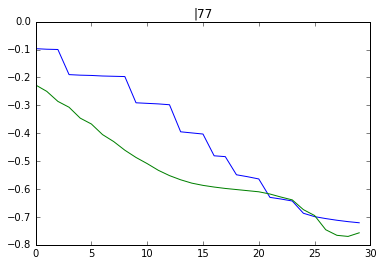

In [68]:
exp_thres(0.1)

# hierarchical clustering approach

This network method could be construed as a hierarchical clustering method. no matter we have a few big clusters(communities) or many small ones, it doesn't really matter, we can merge clsuters with the same majority vote tone label and finally derive the four tone clusters. it's just a matter of which method would result in the best final accuracy of tone labels.

but of course we need to be careful about this - if you have each sample as a cluster, then you merge this way you'll get a perfect result. The thing is, when you merge in this way you're handed the ground truth when you're merging them.

# connected components: Not very useful

In [60]:
def get_connected_components_thresholded(best_threshold):
    pfile='tone-rec-network/downsample_syl_noneut_subset.gpickle'
    print 'loading graph...'
    start_time = time.time()
    #pfile='subdata/downsample_syl_2_meta_100_11.pkl'
    G = nx.read_gpickle(pfile) 
    print("--- %s seconds ---" % (time.time() - start_time))

    #applying a threshold without experimenting with CCs. before, we used 0.4 (result of Sankalp's method)
    #best_threshold=0.2
    esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] <=best_threshold and d['weight']>0.01]
    print len(esmall)
    H=nx.Graph(esmall)
    print 'average cc:'+str(nx.average_clustering(H))

    #community detection
    print 'connected components...'
    connected_comp=sorted(nx.connected_components(H), key = len, reverse=True)
    
    return connected_comp

In [61]:
concomp_02=get_connected_components_thresholded(0.2)

loading graph...
--- 4.90360689163 seconds ---
3394
average cc:0.518901542453
connected components...


In [66]:
for i in concomp_02:
    print len(i)

685
11
7
7
6
5
3
3
3
3
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2


We can see that a large fraction of nodes are connected (but few are fully connected), so it doesn't really make sense to look at connected comp. The community is what we are after, the best measure, after all.